# Инициализация

## Физика

In [2]:
import numpy as np
import meep as mp
import meep.adjoint as mpa
from autograd import numpy as npa, tensor_jacobian_product, grad
from matplotlib import pyplot as plt
import gdspy
import os

Si = mp.Medium(index=3.4)
SiO2 = mp.Medium(index=1.44)

waveguide_width = 0.5 # (μm) толщина волновода
waveguide_length = 2 # (μm) длина прямого волновода перед и после оптимизируемой зоны
arm_separation = 3.5 # (μm) расстояние между ветвями

d_gap = 0.2 # зазор между волноводами
L_gap = 4 # длина зазора
resolution = 20 # (pixels/μm) 

eta_e = 0.5 # % выходной мощности на верхней ветке

wl = 1.55  # Длина волны источника
fcen = 1/wl
df = 0.2
fwidth = df * fcen 
kpoint = mp.Vector3(1,0,0)
mode = 1

# Геометрия простого разветвителя
def branch(D, W, L, L_inter, L_straight_l, L_straight_r, down_edge, z_coord=0, material=Si):
    def curve(x):
        return (L * x, 0.5 * D * np.cos(np.pi * x) + 0.5 * D)

    len = 2*L+L_inter+L_straight_l+L_straight_r
    left = -len/2
    wg = gdspy.Path(abs(W), (L_straight_l, down_edge+W/2))
    wg.parametric(curve)
    points_left_curve = wg.polygons[0]
    wg.mirror((L_straight_l + L,0), (L_straight_l + L , D))
    wg.translate(L_inter,0)
    points_right_curve = wg.polygons[0]
    
    left_curve_pt = [mp.Vector3(x[0] + left,x[1], z_coord) for x in points_left_curve]
    right_curve_pt = [mp.Vector3(x[0] + left,x[1], z_coord) for x in points_right_curve]
    
    left_wg = mp.Block(mp.Vector3(L_straight_l, abs(W)),
            center=mp.Vector3(L_straight_l/2 + left, down_edge+D+W/2),
            material=material)
    right_wg = mp.Block(mp.Vector3(L_straight_r, abs(W)),
            center=mp.Vector3(L_straight_l+L_straight_r/2+2*L+L_inter + left, down_edge+D+W/2),
            material=material)
    centre_wg = mp.Block(mp.Vector3(L_inter, abs(W)),
            center=mp.Vector3(L_straight_l+L+L_inter/2 + left, down_edge+W/2),
            material=material)
    left_curve = mp.Prism(vertices = left_curve_pt,
                       height = mp.inf,
                       material = material,)
    right_curve = mp.Prism(vertices = right_curve_pt,
                       height = mp.inf,
                       material = material,)
    return [left_wg, left_curve, centre_wg, right_curve, right_wg]

def both_branches(arm_separation, W, L, L_inter, L_straight_l, L_straight_r, gap, z=0, material=Si):
    D = arm_separation/2 - d_gap/2 - waveguide_width/2
    geometry_up = branch(D, W, L, L_inter, L_straight_l, L_straight_r, gap/2, z, material=Si)
    geometry_down = branch(-D, -W, L, L_inter, L_straight_l, L_straight_r, - gap/2, z, material=Si)
    geometry = geometry_up + geometry_down
    return geometry


## Симуляция

In [3]:
foldername = f'equal_split_high_res'
filename='splitter'
os.makedirs(foldername, exist_ok=True)

minimum_length = 0.09 # (μm)
filter_radius = minimum_length
eta_i = 0.5 
nfreq=5

design_region_length = 15 # (μm) длина оптимизируемой зоны
design_region_width = 4 # (μm) ширина оптимизируемой зоны
pml_size = 1.0 # (μm) толщина pml

design_region_resolution = int(resolution) # (pixels/μm)
pml_layers = [mp.PML(pml_size)]

Sx = 2*pml_size + 2*waveguide_length + design_region_length # cell size in X
Sy = 2*pml_size + design_region_width + 2 # cell size in Y
cell_size = mp.Vector3(Sx,Sy)

Nx = int(design_region_resolution*design_region_length)+1 #количество пикселей по X
Ny = int(design_region_resolution*design_region_width)+1 # количество пикселей по Y

wg_left = - design_region_length/2 - waveguide_length/2
wg_right = -wg_left
wg_up = arm_separation/2
wg_down = -wg_up
src_left = - design_region_length/2 - 2/3 * waveguide_length
scr_right = - src_left

source_size = mp.Vector3(y=waveguide_width) # размер источников
flux_size = source_size # размер мониторов

source_center1  = [src_left, wg_up]
source_center2  = [src_left, wg_down]
flux_center_src  = [src_left + waveguide_length/3, wg_up]
flux_center1  = [scr_right, wg_up]
flux_center2  = [scr_right, wg_down]

design_variables = mp.MaterialGrid(mp.Vector3(Nx,Ny),SiO2,Si)
design_region = mpa.DesignRegion(design_variables,
    volume=mp.Volume(center=mp.Vector3(), size=mp.Vector3(design_region_length, design_region_width)))

def mapping(x, eta, beta):
    x = (npa.fliplr(x.reshape(Nx,Ny)) + x.reshape(Nx,Ny))/2 # up-down symmetry
    x = (npa.flipud(x.reshape(Nx,Ny)) + x.reshape(Nx,Ny))/2 # left-right symmetry
    # filter
    filtered_field = mpa.conic_filter(x, filter_radius,design_region_length,design_region_width,design_region_resolution)
    projected_field = mpa.tanh_projection(filtered_field,beta,eta)
    # interpolate to actual materials
    return projected_field.flatten()

waveguide_params = {'material': Si, 'size': mp.Vector3(waveguide_length, waveguide_width)}

geometry_des_reg = both_branches(arm_separation, waveguide_width, (design_region_length-L_gap)/2, L_gap, 0, 0, d_gap, material=Si)
geometry_blocks = [mp.Block(center=mp.Vector3(x=wg_left, y=wg_up), **waveguide_params), # top left waveguide
        mp.Block(center=mp.Vector3(x=wg_left, y=wg_down), **waveguide_params), # bottom left waveguide
        mp.Block(center=mp.Vector3(x=wg_right, y=wg_up), **waveguide_params), # top right waveguide
        mp.Block(center=mp.Vector3(x=wg_right, y=wg_down), **waveguide_params), # bottom right waveguide
                  ]
                   
geometry_complex = geometry_blocks + [mp.Block(center=design_region.center, size=design_region.size, material=design_variables)]
geometry_simple = geometry_blocks + geometry_des_reg

source_continuous = mp.ContinuousSource(frequency=fcen)
source_gaussian = mp.GaussianSource(frequency=fcen, fwidth=df)

top_src = {'src': source_gaussian,
           'eig_band': mode, 
           'direction': mp.NO_DIRECTION, 
           'eig_kpoint': kpoint, 
           'size': source_size, 
           'center': source_center1,
           'amplitude': 1.0}

bottom_src = {'src': source_gaussian,
           'eig_band': mode, 
           'direction': mp.NO_DIRECTION, 
           'eig_kpoint': kpoint, 
           'size': source_size, 
           'center': source_center2,
           'amplitude': 0.0 - 1.0j}

#геометрию будем указывать при инициализации
init_des_reg_params = {'cell_size': mp.Vector3(Nx/design_region_resolution, Ny/design_region_resolution),
           'geometry': geometry_des_reg,
           'default_material': SiO2,
           'resolution': design_region_resolution,
           'eps_averaging': False}

sim_params = {'cell_size': mp.Vector3(Sx, Sy),
            'sources': [mp.EigenModeSource(**top_src), mp.EigenModeSource(**bottom_src)],
           'boundary_layers': pml_layers,
           'default_material': SiO2,
           'resolution': design_region_resolution,
           'eps_averaging': False} #геометрию будем указывать при инициализации


## Оптимизация

In [4]:
# Начальная геометрия
init_des_reg = mp.Simulation(**init_des_reg_params)
init_des_reg.init_sim()
eps_matgrid = init_des_reg.get_array(component=mp.Dielectric,
                            center=mp.Vector3(),
                            size=mp.Vector3(Nx/design_region_resolution, Ny/design_region_resolution))
# Нормировка к значениям от 0 до 1
eps_norm = (eps_matgrid - np.min(eps_matgrid))/np.max(eps_matgrid - np.min(eps_matgrid))

# Задание симуляции
sim = mp.Simulation(**sim_params, geometry=geometry_complex)
sim.init_sim()
design_region.update_design_parameters(mapping(eps_norm, eta_i, 100)) #передаем начальную структуру
#design_region.update_design_parameters(mapping(np.random.rand(Nx * Ny), eta_i, 100)) #случайная конфигурация

-----------
Initializing structure...
time for choose_chunkdivision = 0.00295711 s
Working in 2D dimensions.
Computational cell is 15.05 x 4.05 x 0 with resolution 20
     block, center = (-7.5,1.75,0)
          size (0,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     prism, center = (-4.75,1.05,5e+19)
          height 1e+20, axis (0,0,1), sidewall angle: 0 radians, 26 vertices:
          (-7.4951,1.99995,0)
          (-7.13684,1.98579,0)
          (-6.77475,1.94385,0)
          (-6.41462,1.8761,0)
          (-6.05709,1.78557,0)
          (-5.35099,1.55243,0)
          (-4.65731,1.28218,0)
          (-3.97599,1.01668,0)
          (-3.30709,0.795624,0)
          (-2.97712,0.712041,0)
          (-2.64975,0.650417,0)
          (-2.32434,0.612696,0)
          (-1.9951,0.599952,0)
          (-2.0049,0.100048,0)
          (-2.36316,0.114205,0)
          (-2.72525,0.156151,0)
          (-3.08538,0.223902,0)
          (-3

     block, center = (-8.5,1.75,0)
          size (2,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (-8.5,-1.75,0)
          size (2,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (8.5,1.75,0)
          size (2,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (8.5,-1.75,0)
          size (2,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (0,0,0)
          size (15,4,0)
          axes (1,0,0), (0,1,0), (0,0,1)


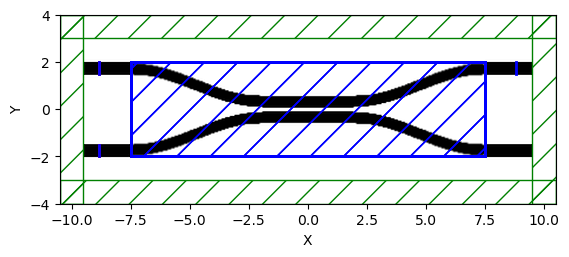

In [5]:
'''
J - оптимизируемая функция 
f - подсчет градиента на каждой итерации
'''

def f(v, gradient, cur_beta):
    print("Current iteration: {}".format(cur_iter[0]+1))
    
    f0, dJ_du = opt([mapping(v, eta_i, cur_beta)])
    
    plt.figure()
    ax = plt.gca()
    opt.plot2D(False,ax=ax,plot_sources_flag=False,plot_monitors_flag=False,plot_boundaries_flag=False)
    ax.axis('off')
    plt.savefig(f"{foldername}/{filename}_{cur_iter[0]}.png")
    plt.show()
    np.save(f"{foldername}/{filename}_{cur_iter[0]}.npy",x)

    if gradient.size > 0:
        gradient[:] = tensor_jacobian_product(mapping,0)(v,eta_i,cur_beta,np.sum(dJ_du,axis=1))
    
    evaluation_history.append(np.max(np.real(f0)))
    
    cur_iter[0] = cur_iter[0] + 1
    
    return np.real(f0)
    

P_out_top = mpa.EigenmodeCoefficient(sim,
        mp.Volume(center=flux_center1,
            size=flux_size),mode)
P_out_bottom = mpa.EigenmodeCoefficient(sim,
        mp.Volume(center=flux_center2,
            size=flux_size),mode)
P_in_top = mpa.EigenmodeCoefficient(sim,
        mp.Volume(center=source_center1,
            size=flux_size),mode)
P_in_bottom = mpa.EigenmodeCoefficient(sim,
        mp.Volume(center=source_center2,
            size=flux_size),mode)

ob_list = [P_out_top, P_in_top, P_in_bottom]

def J(output,top_source,bottom_source):
    power = npa.abs(output) ** 2 / (npa.abs(top_source)**2 + npa.abs(bottom_source)**2) #P_out/(P_in1+P_in2)
    return npa.mean(power)

opt = mpa.OptimizationProblem(
    simulation = sim,
    objective_functions = J,
    objective_arguments = ob_list,
    design_regions = [design_region],
    fcen = fcen,
    df = df,
    nf = nfreq,
    maximum_run_time=500,
)

opt.plot2D(True)



# Define spatial arrays used to generate bit masks
x_g = np.linspace(-design_region_length / 2, design_region_length / 2, Nx)
y_g = np.linspace(-design_region_width / 2, design_region_width / 2, Ny)
X_g, Y_g = np.meshgrid(x_g, y_g, sparse=True, indexing="ij")

# Define the core mask
Si_mask = (npa.abs(X_g) == design_region_length / 2) & ((npa.abs(Y_g) <= (arm_separation + waveguide_width) / 2) & (npa.abs(Y_g) >= (arm_separation - waveguide_width) / 2))

# Define the cladding mask
border_mask = (
    (X_g == -design_region_length / 2)
    | (X_g == design_region_length / 2)
    | (Y_g == -design_region_width / 2)
    | (Y_g == design_region_width / 2)
)
SiO2_mask = border_mask.copy()
SiO2_mask[Si_mask] = False



# Запуск оптимизации

current beta:  4
Current iteration: 1
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000281096 s
Working in 2D dimensions.
Computational cell is 21 x 8 x 0 with resolution 20
     block, center = (-8.5,1.75,0)
          size (2,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (-8.5,-1.75,0)
          size (2,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (8.5,1.75,0)
          size (2,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (8.5,-1.75,0)
          size (2,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (0,0,0)
          size (15,4,0)
          axes (1,0,0), (0,1,0), (0,0,1)
ti

/home/mb/meepdir/envs/mp/lib/python3.11/site-packages/meep/geom.py:588: UserWarning: The weights parameter of MaterialGrid must be in the range [0,1].
  warnings.warn(


MPB solved for frequency_1(2.19355,0,0) = 0.645161 after 1 iters
on time step 1766 (time=44.15), 0.0022671 s/step
on time step 3152 (time=78.8), 0.0028889 s/step
on time step 4735 (time=118.375), 0.00252867 s/step
on time step 6430 (time=160.75), 0.00236016 s/step
on time step 8171 (time=204.275), 0.00229856 s/step
on time step 10067 (time=251.675), 0.00211031 s/step
on time step 11932 (time=298.3), 0.00214497 s/step
on time step 13688 (time=342.2), 0.00227831 s/step
on time step 15378 (time=384.45), 0.00236762 s/step
on time step 17243 (time=431.075), 0.00214529 s/step
on time step 19019 (time=475.475), 0.00225236 s/step
run 0 finished at t = 500.02500000000003 (20001 timesteps)
MPB solved for frequency_1(0.645161,0,0) = 0.189753 after 16 iters
MPB solved for frequency_1(1.85355,0,0) = 0.545161 after 1 iters
Dominant planewave for band 1: (1.853548,-0.000000,0.000000)
MPB solved for frequency_1(0.645161,0,0) = 0.189753 after 20 iters
MPB solved for frequency_1(2.02355,0,0) = 0.595161 

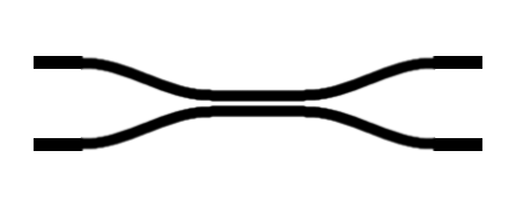

Current iteration: 2
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000271082 s
Working in 2D dimensions.
Computational cell is 21 x 8 x 0 with resolution 20
     block, center = (-8.5,1.75,0)
          size (2,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (-8.5,-1.75,0)
          size (2,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (8.5,1.75,0)
          size (2,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (8.5,-1.75,0)
          size (2,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (0,0,0)
          size (15,4,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilo

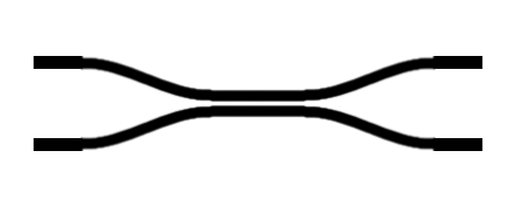

Current iteration: 3
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000271082 s
Working in 2D dimensions.
Computational cell is 21 x 8 x 0 with resolution 20
     block, center = (-8.5,1.75,0)
          size (2,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (-8.5,-1.75,0)
          size (2,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (8.5,1.75,0)
          size (2,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (8.5,-1.75,0)
          size (2,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (0,0,0)
          size (15,4,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilo

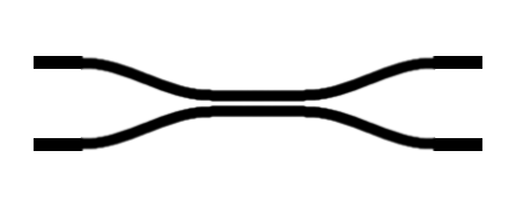

Current iteration: 4
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000272989 s
Working in 2D dimensions.
Computational cell is 21 x 8 x 0 with resolution 20
     block, center = (-8.5,1.75,0)
          size (2,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (-8.5,-1.75,0)
          size (2,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (8.5,1.75,0)
          size (2,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (8.5,-1.75,0)
          size (2,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (0,0,0)
          size (15,4,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilo

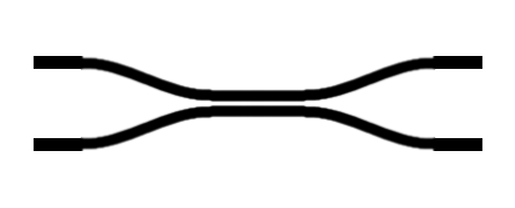

Current iteration: 5
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.00028801 s
Working in 2D dimensions.
Computational cell is 21 x 8 x 0 with resolution 20
     block, center = (-8.5,1.75,0)
          size (2,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (-8.5,-1.75,0)
          size (2,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (8.5,1.75,0)
          size (2,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (8.5,-1.75,0)
          size (2,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (0,0,0)
          size (15,4,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon

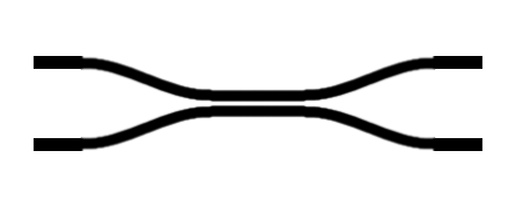

Current iteration: 6
Starting forward run...
-----------
Initializing structure...
time for choose_chunkdivision = 0.000261068 s
Working in 2D dimensions.
Computational cell is 21 x 8 x 0 with resolution 20
     block, center = (-8.5,1.75,0)
          size (2,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (-8.5,-1.75,0)
          size (2,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (8.5,1.75,0)
          size (2,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (8.5,-1.75,0)
          size (2,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (0,0,0)
          size (15,4,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilo

In [ ]:
import nlopt

algorithm = nlopt.LD_MMA
n = Nx * Ny # number of parameters

evaluation_history = []
cur_iter = [0]
# Initial guess
x = eps_norm.flatten()
x[Si_mask.flatten()] = 1  # set the edges of waveguides to silicon
x[SiO2_mask.flatten()] = 0  # set the other edges to SiO2
# lower and upper bounds
lb = np.zeros((Nx * Ny,))
lb[Si_mask.flatten()] = 1
ub = np.ones((Nx * Ny,))
ub[SiO2_mask.flatten()] = 0
cur_beta = 4
beta_scale = 2
num_betas = 10
update_factor = 30

for iters in range(num_betas):
    print("current beta: ",cur_beta)
    solver = nlopt.opt(algorithm, n)
    solver.set_lower_bounds(lb)
    solver.set_upper_bounds(ub)
    solver.set_max_objective(lambda a,g: f(a,g,cur_beta))
    solver.set_maxeval(update_factor)
    x[:] = solver.optimize(x)    
    cur_beta = cur_beta*beta_scale

np.save(f"{foldername}/splitter_final.npy",x)


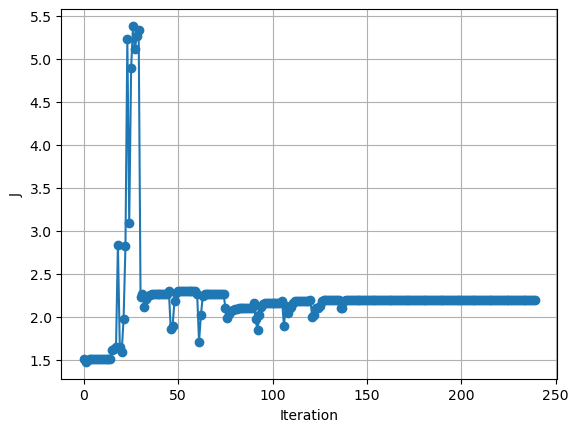

'\nplt.figure()\nplt.plot(-10*np.log10(evaluation_history),\'o-\')\nplt.grid(True)\nplt.xlabel(\'Iteration\')\nplt.ylabel("Average Insertion Loss (dB)")\nplt.show()\n'

In [16]:
np.save(f"{foldername}/evaluation_history.npy",np.array(evaluation_history))
plt.figure()
plt.plot(evaluation_history,'o-')
plt.grid(True)
plt.xlabel('Iteration')
plt.ylabel('J')
plt.show()
'''
plt.figure()
plt.plot(-10*np.log10(evaluation_history),'o-')
plt.grid(True)
plt.xlabel('Iteration')
plt.ylabel("Average Insertion Loss (dB)")
plt.show()
'''

## Чтение структуры из файла

In [126]:
x=np.load(f"{foldername}/splitter_final.npy")
#evaluation_history=np.load("evaluation_history.npy")
design_region.update_design_parameters(mapping(x, eta_i, 10000))

# Измерение мощности

In [17]:
sim_opt = mp.Simulation(**sim_params, geometry=geometry_complex)
sim_norm = mp.Simulation(**sim_params, geometry=geometry_simple)

sim_opt.sources=[mp.EigenModeSource(**top_src)]
sim_norm.sources=[mp.EigenModeSource(**top_src)]

sim_opt.resolution=resolution
sim_norm.resolution=resolution

# монитор потока на верхней ветке
up_fr = mp.FluxRegion(center=flux_center1, size=flux_size)
up_opt = sim_opt.add_flux(fcen, fwidth, nfreq, up_fr)
up_norm = sim_norm.add_flux(fcen, fwidth, nfreq, up_fr)

# на нижней ветке
down_fr = mp.FluxRegion(center=flux_center2, size=flux_size)
down_opt= sim_opt.add_flux(fcen, fwidth, nfreq, down_fr)
down_norm= sim_norm.add_flux(fcen, fwidth, nfreq, down_fr)

# у источника
src_fr = mp.FluxRegion(center=flux_center_src,
                              size=flux_size)
src_opt= sim_opt.add_flux(fcen, fwidth, nfreq, src_fr)
src_norm= sim_norm.add_flux(fcen, fwidth, nfreq, src_fr)

sim_opt.run(until_after_sources=mp.stop_when_fields_decayed(50, mp.Ez, source_center1, 1e-3)) 
sim_norm.run(until_after_sources=mp.stop_when_fields_decayed(50, mp.Ez, source_center1, 1e-3)) 


flux = {"wls": 1/np.array(mp.get_flux_freqs(up_norm)),
        "complex": {"up": np.array(mp.get_fluxes(up_opt)),
                  "down": np.array(mp.get_fluxes(down_opt)),
                  "source": np.array(mp.get_fluxes(src_opt))},
        "simple": {"up": np.array(mp.get_fluxes(up_norm)),
                  "down": np.array(mp.get_fluxes(down_norm)),
                  "source": np.array(mp.get_fluxes(src_norm))}
       }

-----------
Initializing structure...
time for choose_chunkdivision = 0.000309944 s
Working in 2D dimensions.
Computational cell is 21 x 8 x 0 with resolution 20
     block, center = (-8.5,1.75,0)
          size (2,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (-8.5,-1.75,0)
          size (2,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (8.5,1.75,0)
          size (2,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (8.5,-1.75,0)
          size (2,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (0,0,0)
          size (15,4,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.126903 s
-----------
MPB solved for fre

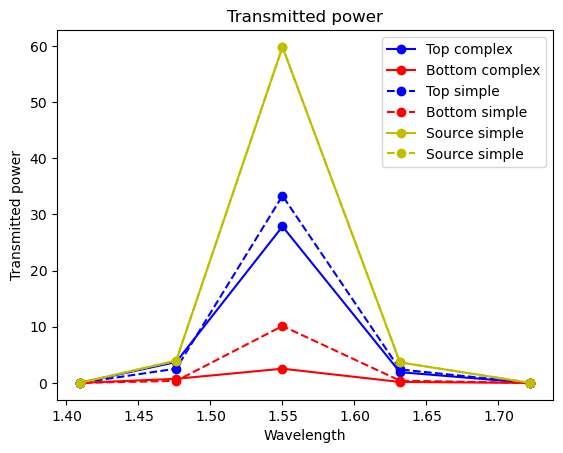

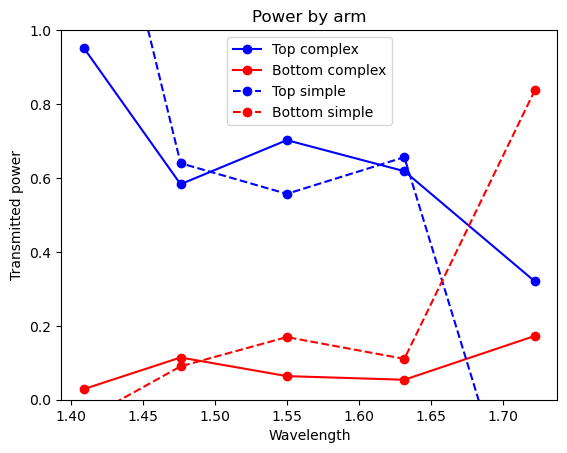

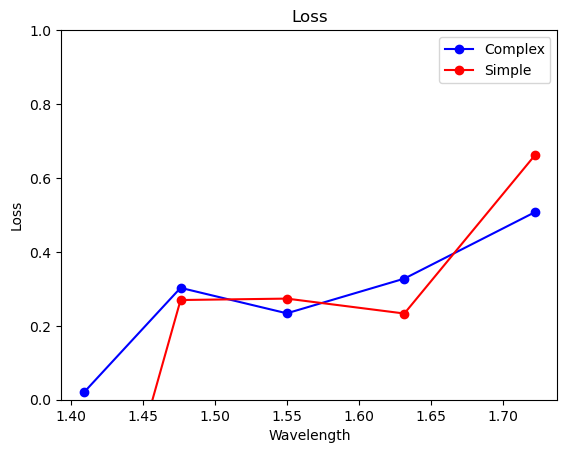

In [18]:
plots = {"Transmitted power": {"x": flux["wls"], 
                                       "y": [flux["complex"]["up"], flux["complex"]["down"], 
                                             flux["simple"]["up"], flux["simple"]["down"],
                                             flux["simple"]["source"], flux["simple"]["source"]], 
                                       "colors": ["bo-", "ro-", "bo--", "ro--", "yo-", "yo--"],
                                       "legend": ["Top complex", "Bottom complex", "Top simple", "Bottom simple", "Source simple", "Source simple"],
                                       "xlabel": "Wavelength", 
                                       "ylabel": "Transmitted power", 
                                       "filename": "Total_power"},
         "Power by arm": {"x": flux["wls"], 
                                  "y": [flux["complex"]["up"]/flux["complex"]["source"], 
                                       flux["complex"]["down"]/flux["complex"]["source"],
                                       flux["simple"]["up"]/flux["simple"]["source"],
                                       flux["simple"]["down"]/flux["simple"]["source"]], 
                                  "colors": ["bo-", "ro-", "bo--", "ro--"],
                                  "legend": ["Top complex", "Bottom complex", "Top simple", "Bottom simple"],
                                  "xlabel": "Wavelength", 
                                  "ylabel": "Transmitted power", 
                                  "ylim": (0,1),
                                  "filename": "Power_by_arm"},
         "Loss": {"x": flux["wls"], 
                                  "y": [1-((flux["complex"]["down"] + flux["complex"]["up"]) / flux["complex"]["source"] ),
                                       1-((flux["simple"]["down"] + flux["simple"]["up"]) / flux["simple"]["source"] )], 
                                  "colors": ["bo-", "ro-"],
                                  "legend": ["Complex", "Simple"],
                                  "xlabel": "Wavelength", 
                                  "ylabel": "Loss", 
                                  "ylim": (0,1),
                                  "filename": "Loss"}
        }

for p in plots:
    for y, c in zip(plots[p]["y"], plots[p]["colors"]):
        plt.plot(plots[p]["x"], y, c)
    plt.title(p)
    plt.xlabel(plots[p].get("xlabel"))
    plt.ylabel(plots[p].get("ylabel"))
    plt.legend(plots[p].get("legend"))
    plt.ylim(plots[p].get("ylim"))
    plt.title(p)
    plt.savefig(f'{foldername}/{plots[p]["filename"]}.png')
    plt.show()

     block, center = (-8.5,1.75,0)
          size (2,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (-8.5,-1.75,0)
          size (2,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (8.5,1.75,0)
          size (2,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (8.5,-1.75,0)
          size (2,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (0,0,0)
          size (15,4,0)
          axes (1,0,0), (0,1,0), (0,0,1)
     block, center = (-8.5,1.75,0)
          size (2,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (-8.5,-1.75,0)
          size (2,0.

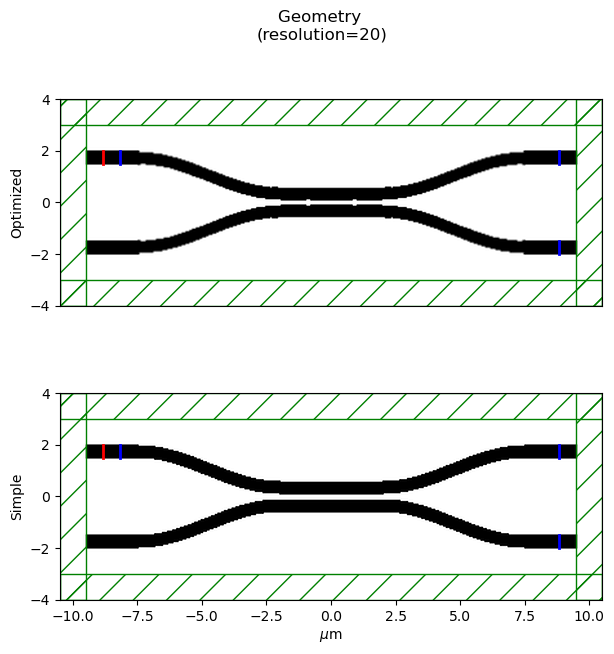

In [19]:
fig, (ax1, ax2) = plt.subplots(2, 1,figsize=(7,7))
fig.suptitle(f'Geometry \n(resolution={sim_opt.resolution})')
sim_opt.plot2D(ax=ax1)
ax1.set_ylabel('Optimized')
ax1.get_xaxis().set_visible(False)

sim_norm.plot2D(ax=ax2)
ax2.set_xlabel('$\mu$m')
ax2.set_ylabel('Simple')

plt.savefig(f"{foldername}/Geometry.png")
plt.show()

     block, center = (-8.5,1.75,0)
          size (2,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (-8.5,-1.75,0)
          size (2,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (8.5,1.75,0)
          size (2,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (8.5,-1.75,0)
          size (2,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (0,0,0)
          size (15,4,0)
          axes (1,0,0), (0,1,0), (0,0,1)
     block, center = (-8.5,1.75,0)
          size (2,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (-8.5,-1.75,0)
          size (2,0.

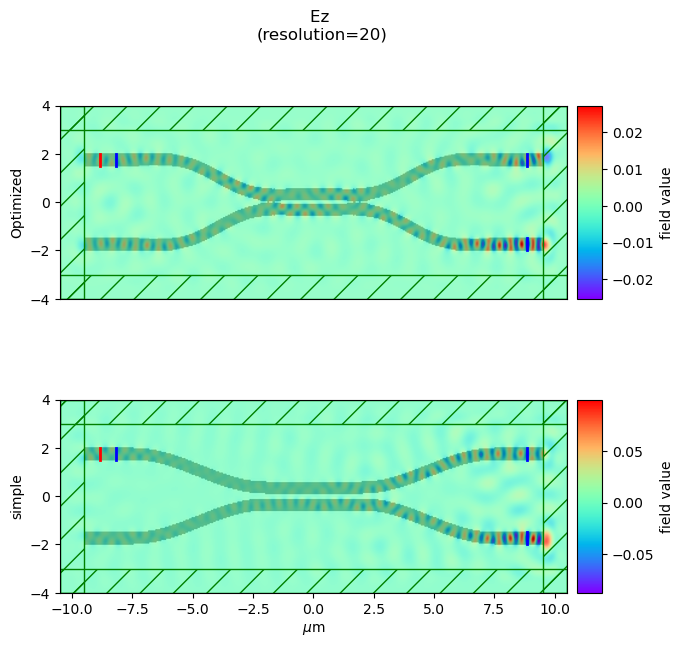

In [133]:
fig, (ax1, ax2) = plt.subplots(2, 1,figsize=(7,7))
fig.suptitle(f'Ez \n(resolution={sim_opt.resolution})')
sim_opt.plot2D(ax=ax1, fields=mp.Ez, field_parameters={'colorbar':True, 'cmap':'rainbow', 'alpha':0.75})
ax1.set_ylabel('Optimized')
ax1.get_xaxis().set_visible(False)

sim_norm.plot2D(ax=ax2, fields=mp.Ez, field_parameters={'colorbar':True, 'cmap':'rainbow', 'alpha':0.75})
ax2.set_xlabel('$\mu$m')
ax2.set_ylabel('Cimple')

plt.savefig(f"{foldername}/Evaluation.png")
plt.show()

-----------
Initializing structure...
time for choose_chunkdivision = 0.000273943 s
Working in 2D dimensions.
Computational cell is 21 x 8 x 0 with resolution 20
     block, center = (-8.5,1.75,0)
          size (2,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (-8.5,-1.75,0)
          size (2,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (8.5,1.75,0)
          size (2,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (8.5,-1.75,0)
          size (2,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (0,0,0)
          size (15,4,0)
          axes (1,0,0), (0,1,0), (0,0,1)
time for set_epsilon = 0.122387 s
-----------
MPB solved for fre

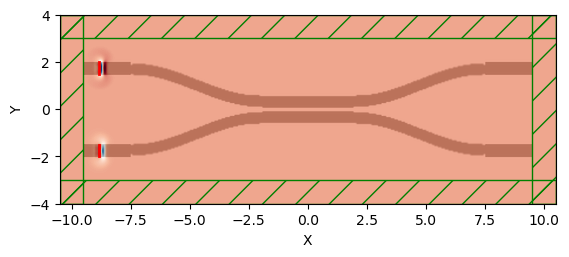

Meep progress: 22.3/100.0 = 22.3% done in 4.0s, 13.9s to go
on time step 892 (time=22.3), 0.0044856 s/step
Meep progress: 47.0/100.0 = 47.0% done in 8.0s, 9.0s to go
on time step 1880 (time=47), 0.00406482 s/step
Meep progress: 75.0/100.0 = 75.0% done in 12.0s, 4.0s to go
on time step 3000 (time=75), 0.00359295 s/step
Normalizing field data...
run 0 finished at t = 100.0 (4000 timesteps)


In [5]:
sim_opt.reset_meep()
Animate = mp.Animate2D(fields=mp.Ez, realtime=True, normalize=True)
sim_opt.run(mp.at_every(1, Animate), until_after_sources=mp.stop_when_fields_decayed(10, mp.Ez, flux_center1, 1e-3))
plt.close()
Animate.to_jshtml(10)

-----------
Initializing structure...
time for choose_chunkdivision = 0.00507903 s
Working in 2D dimensions.
Computational cell is 21 x 8 x 0 with resolution 20
     block, center = (-8.5,1.75,0)
          size (2,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (-8.5,-1.75,0)
          size (2,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (8.5,1.75,0)
          size (2,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (8.5,-1.75,0)
          size (2,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11.56,11.56)
     block, center = (-7.5,1.75,0)
          size (0,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.56,11

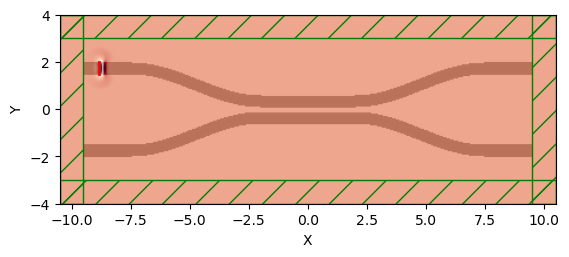

on time step 440 (time=11), 0.00919824 s/step
field decay(t = 20.05): 1.2877701349367916e-104 / 1.2877701349367916e-104 = 1.0
field decay(t = 30.075000000000003): 7.420656331415721e-16 / 7.420656331415721e-16 = 1.0
on time step 1343 (time=33.575), 0.00443247 s/step
field decay(t = 40.1): 3.568645867437527e-11 / 3.568645867437527e-11 = 1.0
field decay(t = 50.125): 1.1759382026854401e-07 / 1.1759382026854401e-07 = 1.0
on time step 2244 (time=56.1), 0.00444779 s/step
field decay(t = 60.150000000000006): 3.0674268110683426e-05 / 3.0674268110683426e-05 = 1.0
field decay(t = 70.175): 0.0007140802372981054 / 0.0007140802372981054 = 1.0
on time step 3072 (time=76.8), 0.00483249 s/step
field decay(t = 80.2): 0.0016835917520615635 / 0.0016835917520615635 = 1.0
field decay(t = 90.22500000000001): 0.04013861309824958 / 0.04013861309824958 = 1.0
field decay(t = 100.25): 2.0369010075345693 / 2.0369010075345693 = 1.0
on time step 4019 (time=100.475), 0.00422705 s/step
field decay(t = 110.275): 4.9367

In [135]:
sim_norm.reset_meep()
Animate = mp.Animate2D(fields=mp.Ez, realtime=True, normalize=True)
sim_norm.run(mp.at_every(1, Animate), until_after_sources=mp.stop_when_fields_decayed(10, mp.Ez, flux_center1, 1e-3))
plt.close()
Animate.to_jshtml(10)